# Computer Vision
The area of computer science that deals with the image classification, object detection , video processing and so on is called computer vision

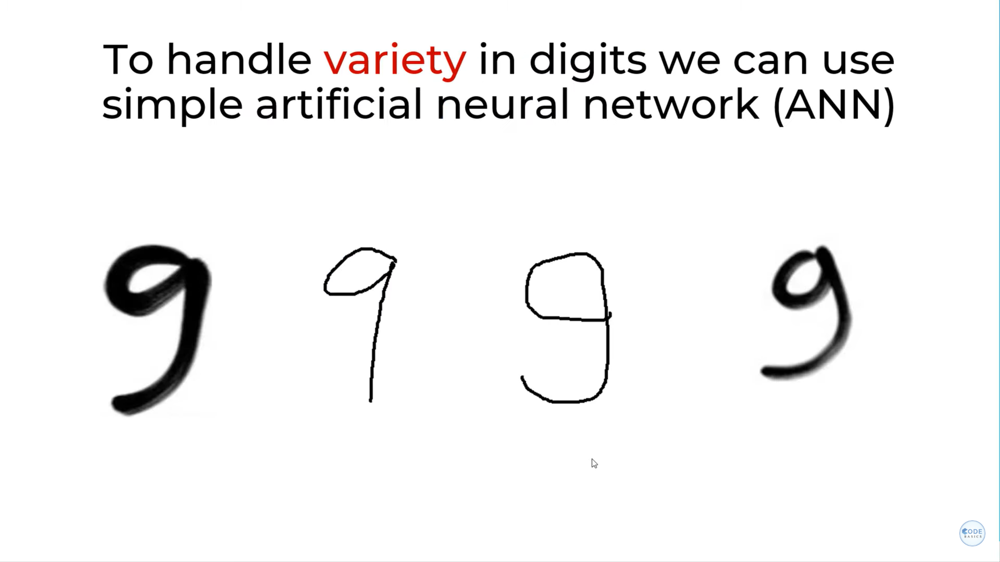

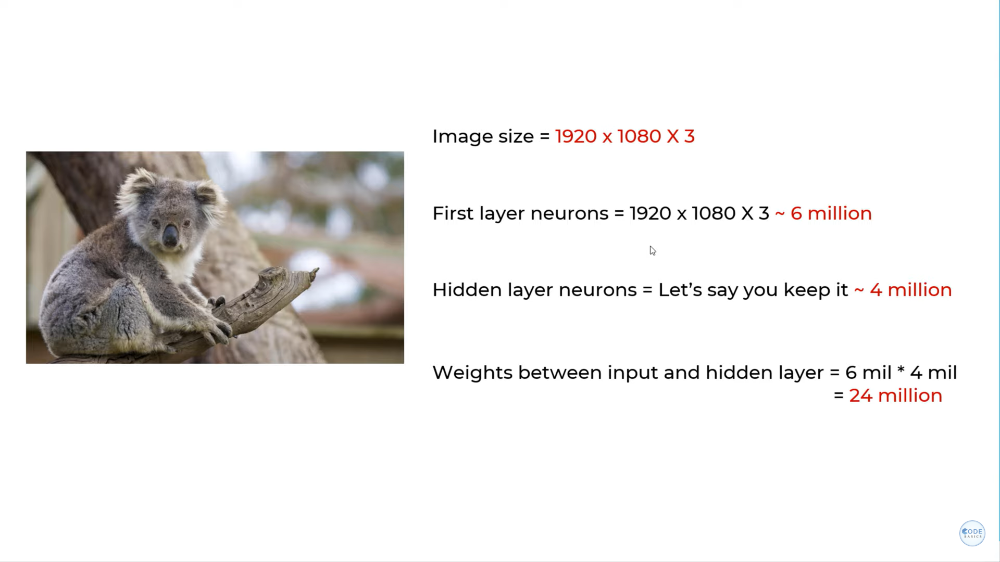
We can observe that there is too much computation.

**Disadvantages of using ANN for Image classification**
1. Too much computation.
2. Treat local pixels as pixels far apart.
3. Sensitive to location of an object in an image.

# CNN (Convolutional Neural Networks)
A convolutional neural network (CNN) is a type of artificial neural network used primarily for image recognition and processing, due to its ability to recognize patterns in images. A CNN is a powerful tool but requires millions of labelled data points for training.

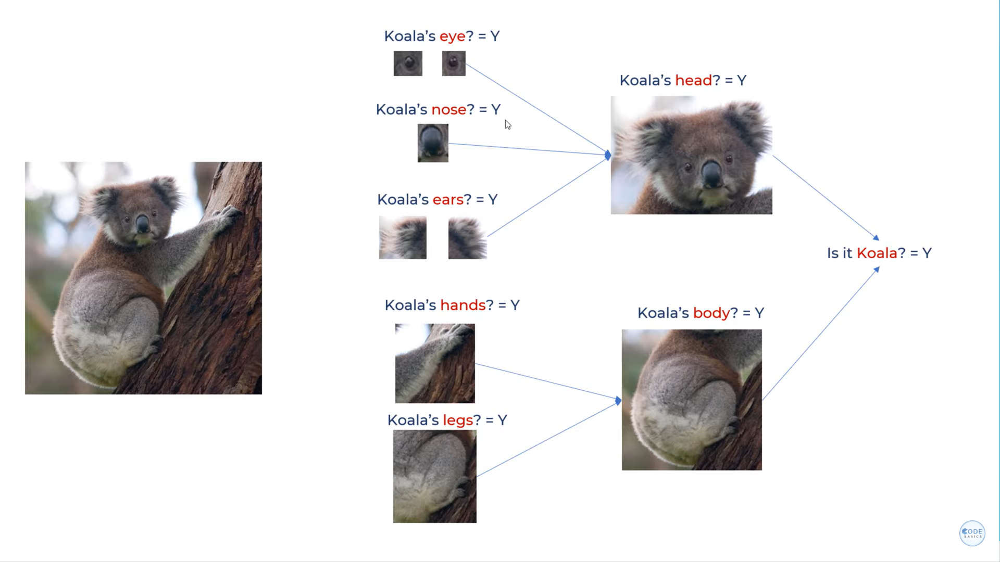

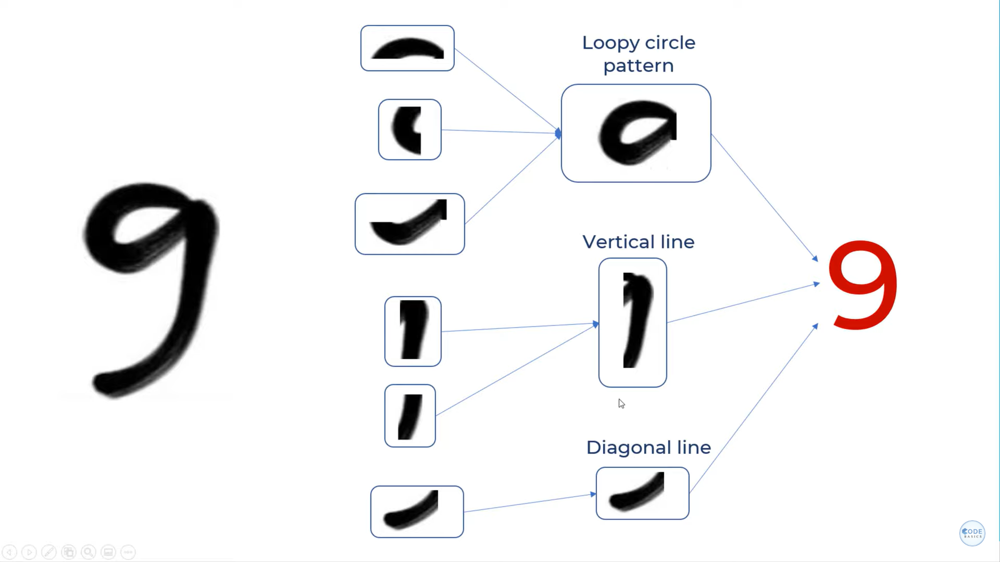

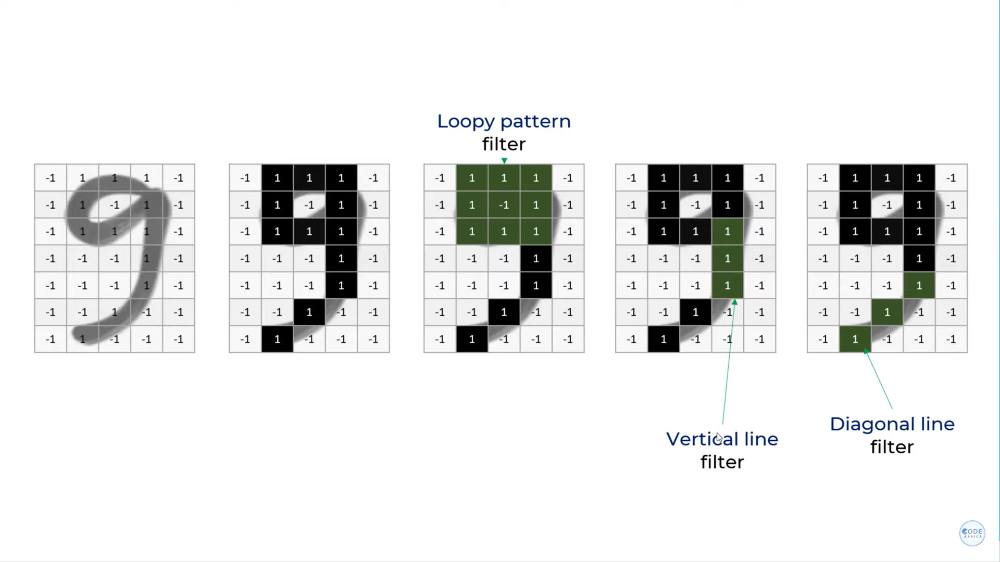

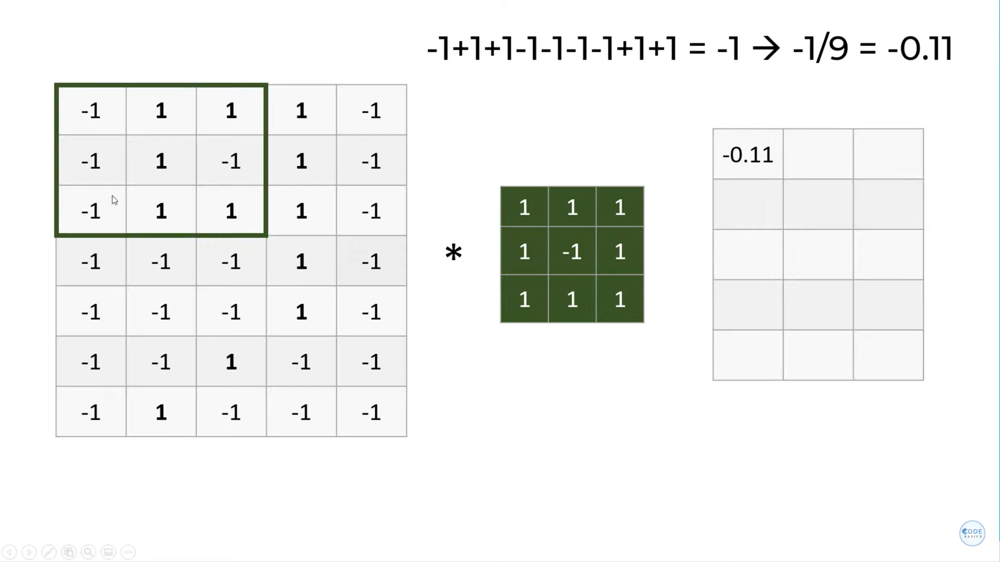

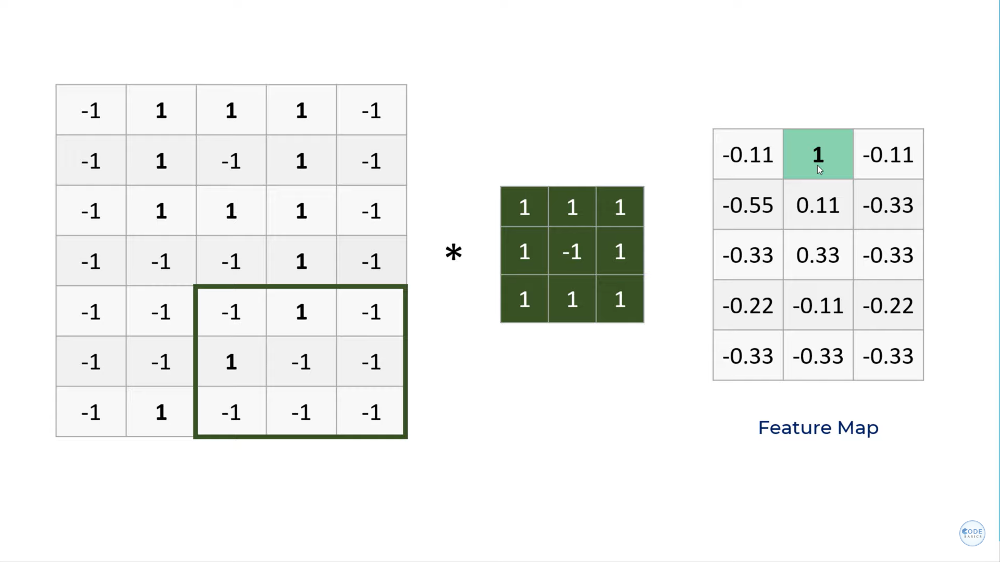

The multiplication in the above picture in not matrix multiplication.    
It is just an adjacent cells multiplication.

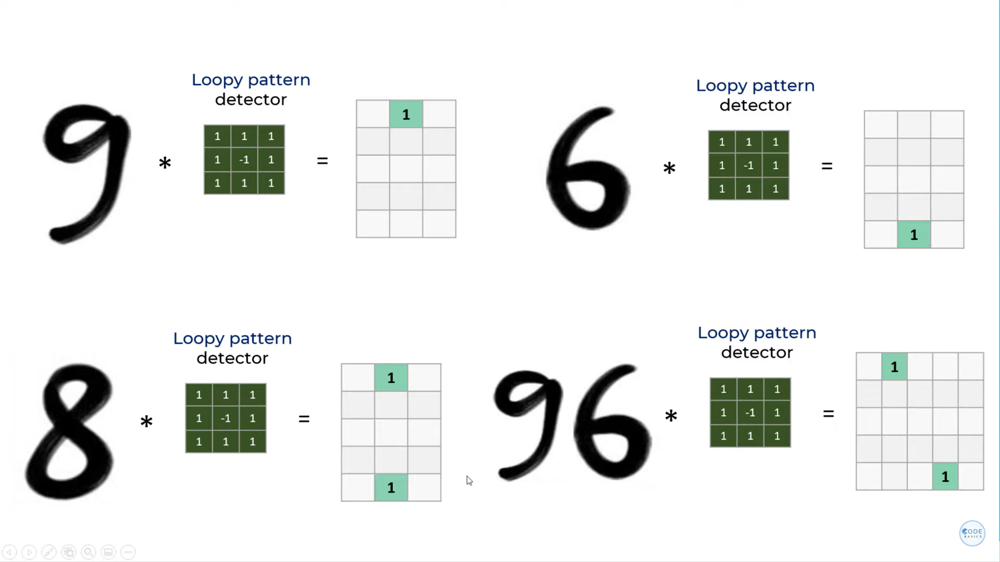

**Filters are nothing but feature detectors**

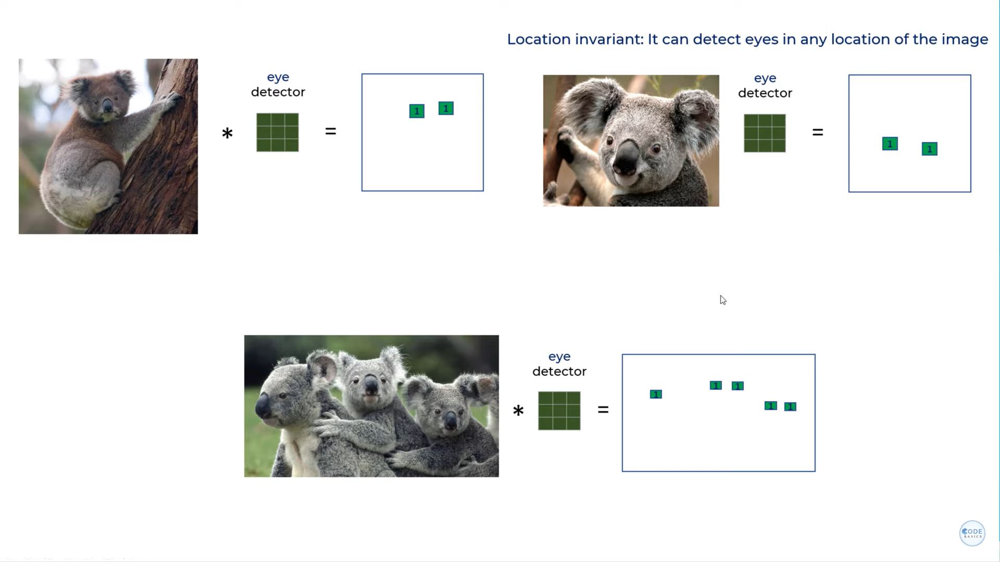

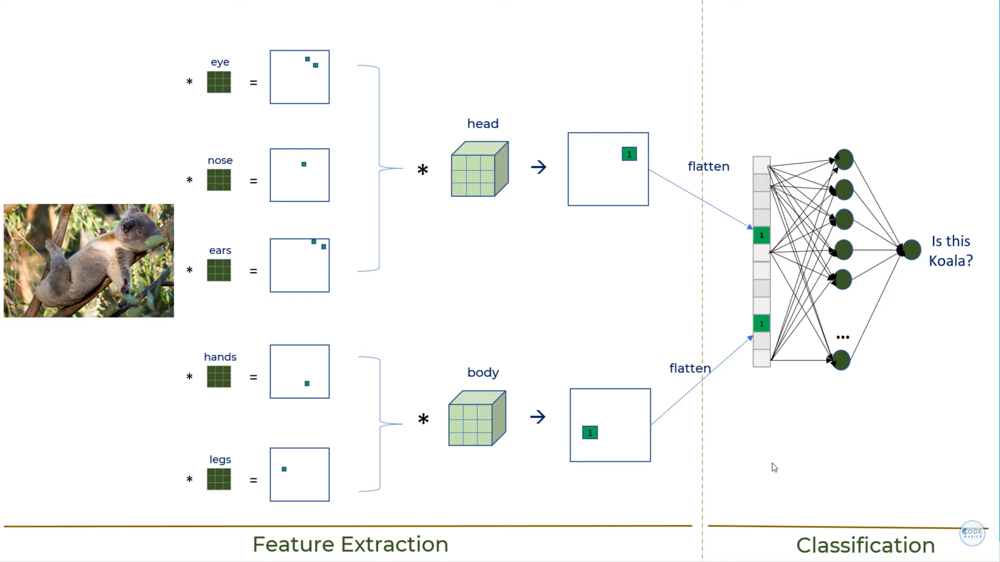

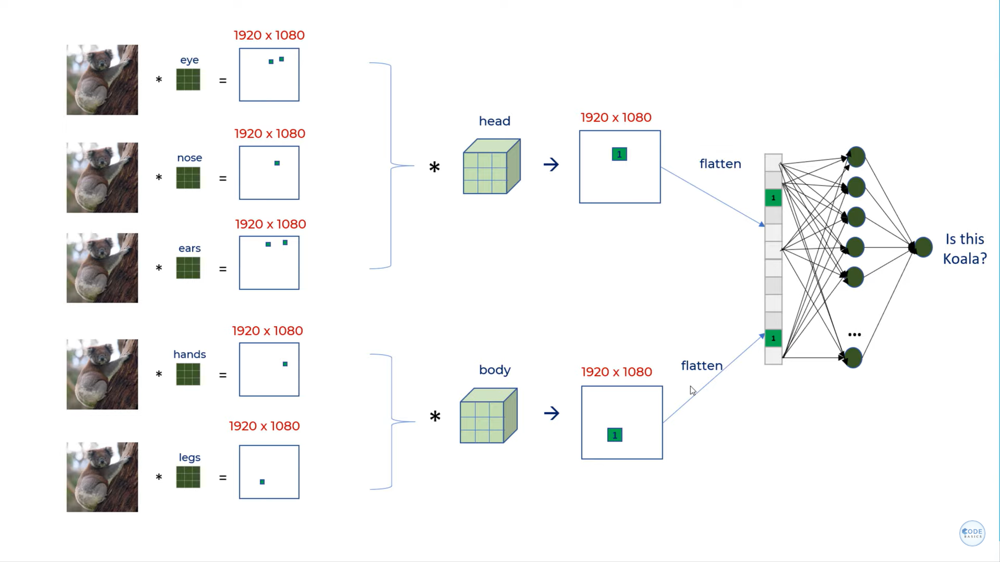
computation is not handled

**Pooling layer is used to reduce the size**

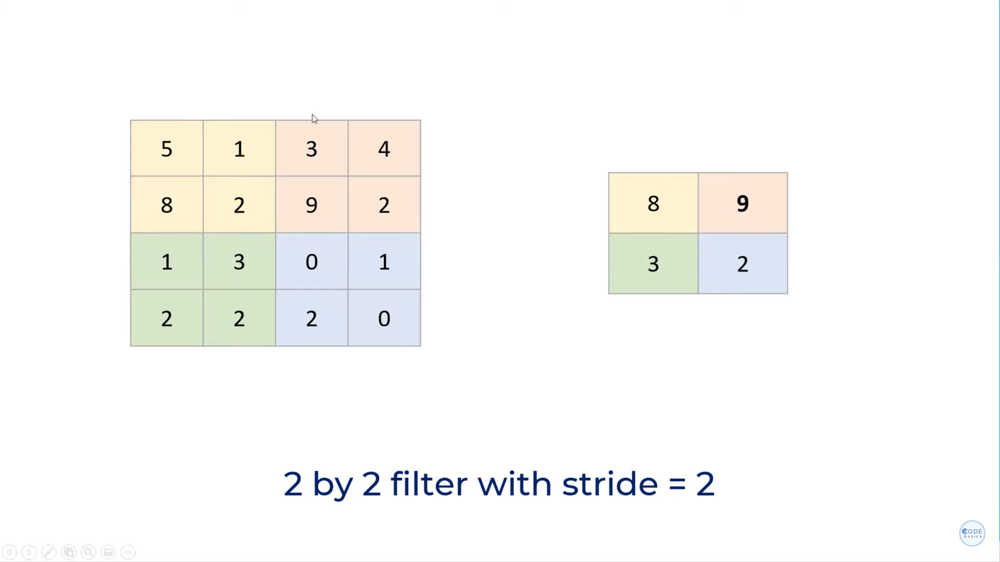

Here maximum is number is choose in from each box, however average can also be taken.

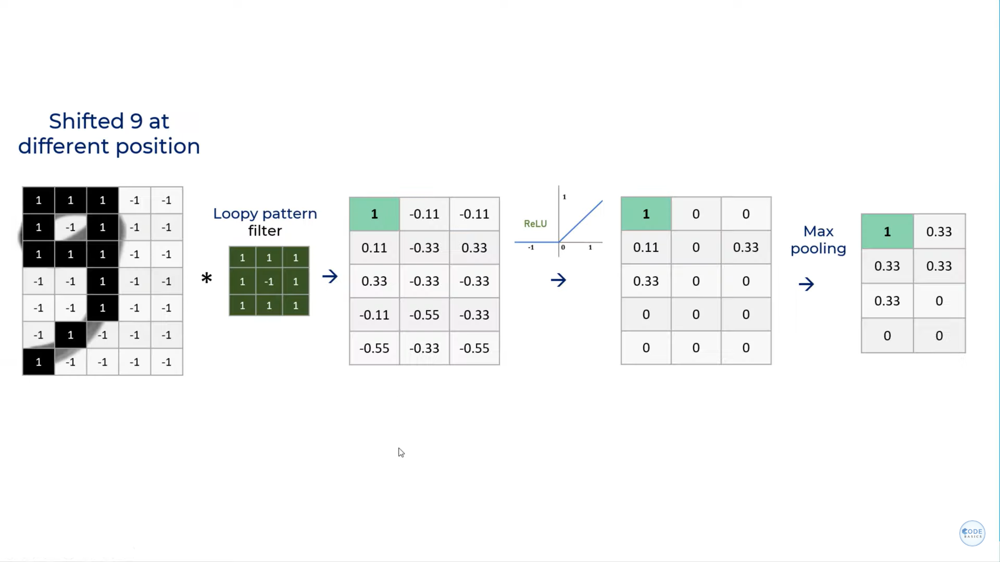

**Benefits of Pooling**
1. Reduces dimensions and computation.
2. Reduces overfitting as there are less number of parameters. 
3. Model is tolerant towards variations and distortions.

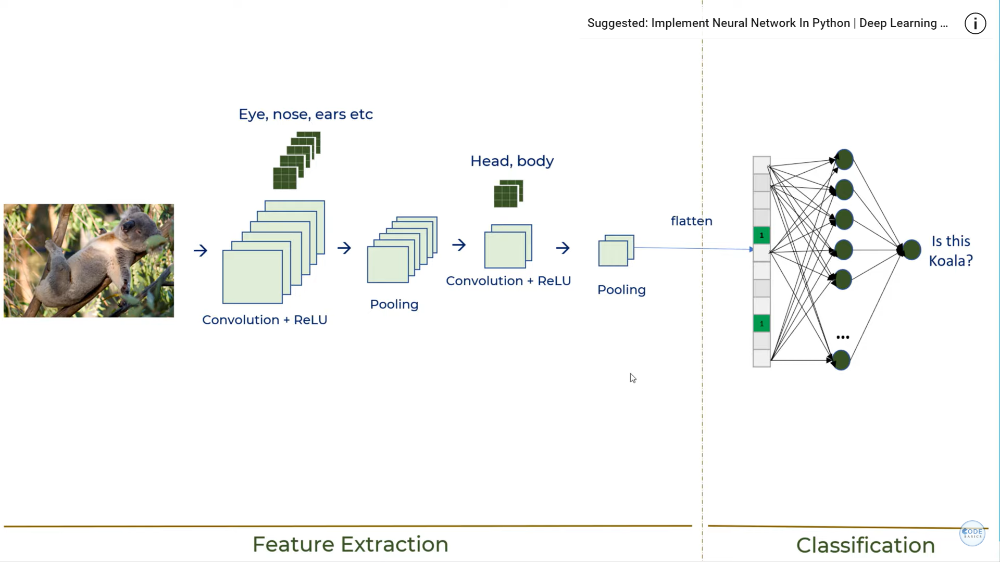

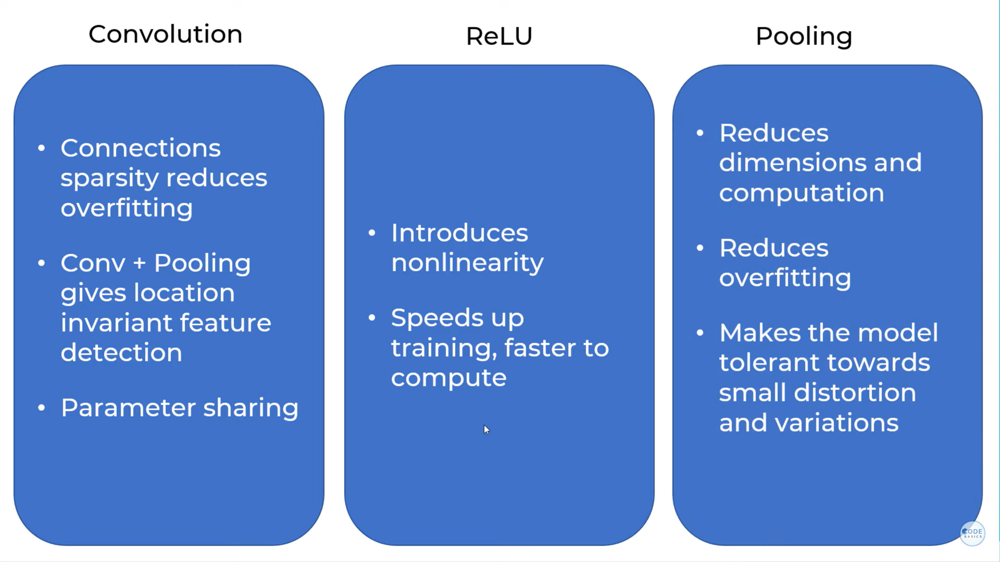

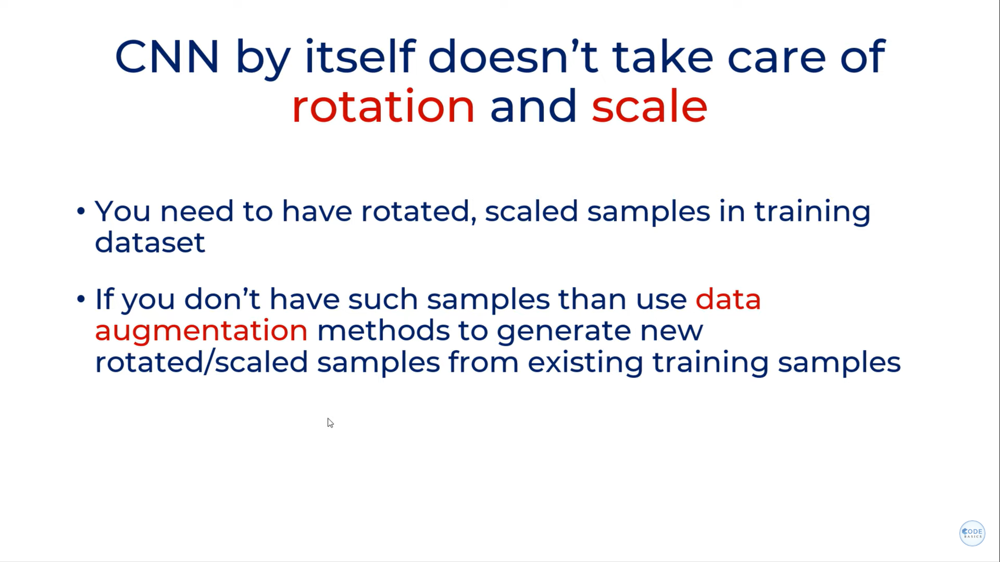

**Importing cifar10 dataset**

In [1]:
from tensorflow import keras
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
(x_train,y_train),(x_test,y_test)=keras.datasets.cifar10.load_data()

In [3]:
x_train.shape

(50000, 32, 32, 3)

In [4]:
x_test.shape

(10000, 32, 32, 3)

In [5]:
classes = ["airplane","automobile","bird","cat","deer","dog","frog","horse","ship","truck"]

In [6]:
y_train

array([[6],
       [9],
       [9],
       ...,
       [9],
       [1],
       [1]], dtype=uint8)

In [7]:
y_train.shape

(50000, 1)

In [8]:
#reshaping
y_train=y_train.reshape(-1,)#y_train=y_train.reshape(y_train.shape[0],)
y_train

array([6, 9, 9, ..., 9, 1, 1], dtype=uint8)

In [9]:
y_test=y_test.reshape(-1,)#y_train=y_train.reshape(y_train.shape[0],)
y_test

array([3, 8, 8, ..., 5, 1, 7], dtype=uint8)

In [10]:
def plot_sample(x,y,index):
    plt.imshow(x[index])
    plt.xlabel(classes[y[index]])
    plt.plot()

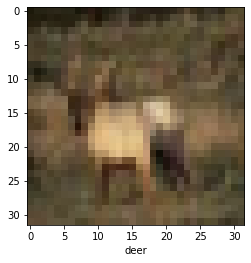

In [11]:
plot_sample(x_train,y_train,3)

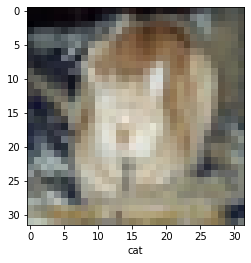

In [12]:
plot_sample(x_train,y_train,33)

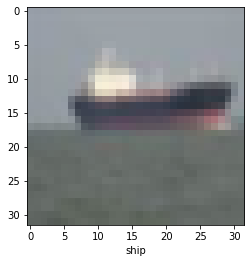

In [13]:
plot_sample(x_train,y_train,69)

**Scaling x values**

In [14]:
x_train=x_train/255
x_test=x_test/255

**Build simple artificial neural network for image classification**

In [22]:
ann = keras.Sequential([
        keras.layers.Flatten(input_shape=(32,32,3)),
        keras.layers.Dense(3000, activation='relu'),
        keras.layers.Dense(1000, activation='relu'),
        keras.layers.Dense(10, activation='softmax')    
    ])

ann.compile(optimizer='SGD',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

ann.fit(x_train, y_train, epochs=5)

Epoch 1/5
1563/1563 [==============================] - 136s 86ms/step - loss: 1.8122 - accuracy: 0.3541
Epoch 2/5
1563/1563 [==============================] - 131s 84ms/step - loss: 1.6236 - accuracy: 0.4245
Epoch 3/5
1563/1563 [==============================] - 132s 84ms/step - loss: 1.5432 - accuracy: 0.4546
Epoch 4/5
1563/1563 [==============================] - 134s 86ms/step - loss: 1.4819 - accuracy: 0.4767
Epoch 5/5
1563/1563 [==============================] - 131s 84ms/step - loss: 1.4335 - accuracy: 0.4957


**Difference between categorical_crossentropy and sparse_categorical_crossentropy**
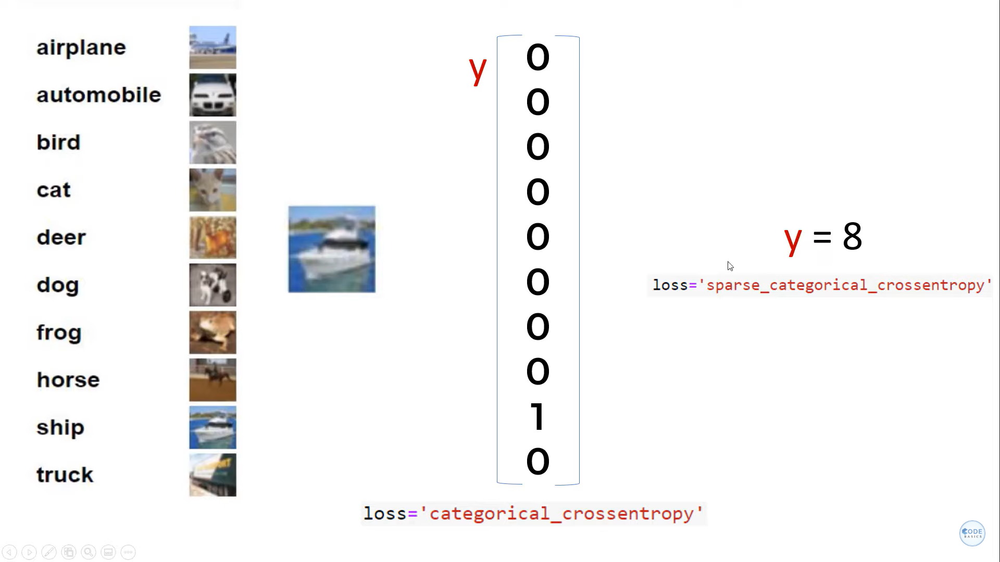

**Sigmoid**      
1 -> 0.45       
2 -> 0.67      
**Softmax** normalising        
1 -> (0.45)/(0.45+0.67)         
2 -> (0.67)/(0.45+0.67)        
In softmax sum of 1 and 2 is equal to 1

**You can see that at the end of 5 epochs, accuracy is at around 49%**

In [23]:
from sklearn.metrics import confusion_matrix , classification_report
y_pred = ann.predict(x_test)
y_pred_classes = [np.argmax(element) for element in y_pred]

print("Classification Report: \n", classification_report(y_test, y_pred_classes))

313/313 [==============================] - 12s 32ms/step
Classification Report: 
               precision    recall  f1-score   support

           0       0.57      0.47      0.51      1000
           1       0.61      0.60      0.61      1000
           2       0.35      0.38      0.36      1000
           3       0.40      0.25      0.31      1000
           4       0.42      0.39      0.40      1000
           5       0.43      0.35      0.39      1000
           6       0.40      0.76      0.53      1000
           7       0.65      0.43      0.51      1000
           8       0.53      0.70      0.60      1000
           9       0.58      0.51      0.55      1000

    accuracy                           0.48     10000
   macro avg       0.49      0.48      0.48     10000
weighted avg       0.49      0.48      0.48     10000



**Now let us build a convolutional neural network to train our images**

In [19]:
cnn=keras.Sequential([
    keras.layers.Conv2D(filters=32,kernel_size=(3,3),activation='relu',input_shape=(32,32,3)),
    keras.layers.MaxPool2D((2,2)),
    keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(10, activation='softmax')
])

In [20]:
cnn.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

In [24]:
cnn.fit(x_train, y_train, epochs=10)

Epoch 1/10
1563/1563 [==============================] - 89s 57ms/step - loss: 0.9465 - accuracy: 0.6712
Epoch 2/10
1563/1563 [==============================] - 67s 43ms/step - loss: 0.8622 - accuracy: 0.6999
Epoch 3/10
1563/1563 [==============================] - 70s 45ms/step - loss: 0.7875 - accuracy: 0.7279
Epoch 4/10
1563/1563 [==============================] - 82s 52ms/step - loss: 0.7281 - accuracy: 0.7479
Epoch 5/10
1563/1563 [==============================] - 59s 38ms/step - loss: 0.6743 - accuracy: 0.7659
Epoch 6/10
1563/1563 [==============================] - 55s 35ms/step - loss: 0.6348 - accuracy: 0.7791
Epoch 7/10
1563/1563 [==============================] - 52s 33ms/step - loss: 0.5898 - accuracy: 0.7956
Epoch 8/10
1563/1563 [==============================] - 51s 32ms/step - loss: 0.5499 - accuracy: 0.8057
Epoch 9/10
1563/1563 [==============================] - 50s 32ms/step - loss: 0.5170 - accuracy: 0.8193
Epoch 10/10
1563/1563 [==============================] - 46s 30m

In [25]:
cnn.evaluate(x_test,y_test)

313/313 [==============================] - 5s 11ms/step - loss: 1.0104 - accuracy: 0.7014


[1.0104366540908813, 0.7013999819755554]

In [26]:
y_pred=cnn.predict(x_test)

313/313 [==============================] - 4s 11ms/step


In [27]:
y_pred

array([[1.50109881e-05, 1.71856627e-05, 7.48831008e-06, ...,
        2.68749022e-06, 1.86083082e-03, 1.15174380e-05],
       [4.40265321e-05, 6.05642656e-03, 7.70376289e-07, ...,
        5.04866253e-11, 9.93497849e-01, 4.00908611e-04],
       [6.22272789e-02, 4.78199497e-02, 1.69116262e-04, ...,
        1.27330115e-02, 3.13398629e-01, 5.22058904e-01],
       ...,
       [4.22361045e-05, 2.11701057e-09, 1.39386281e-01, ...,
        1.90245301e-01, 7.44552381e-06, 2.52022869e-06],
       [4.79685925e-02, 5.47557650e-03, 9.43114283e-04, ...,
        7.61392175e-06, 7.38403396e-05, 2.53200356e-04],
       [1.13211875e-07, 2.30314583e-07, 1.38788046e-05, ...,
        9.98329103e-01, 3.25568585e-08, 1.28499960e-06]], dtype=float32)

In [28]:
y_pred_new=[np.argmax(i) for i in y_pred]

In [33]:
y_pred_new=np.array(y_pred_new)
y_pred_new

array([3, 8, 9, ..., 5, 4, 7], dtype=int64)

In [35]:
print(classification_report(y_test,y_pred_new))

              precision    recall  f1-score   support

           0       0.74      0.71      0.72      1000
           1       0.82      0.81      0.82      1000
           2       0.61      0.59      0.60      1000
           3       0.50      0.55      0.53      1000
           4       0.70      0.59      0.64      1000
           5       0.62      0.56      0.59      1000
           6       0.78      0.77      0.78      1000
           7       0.73      0.77      0.75      1000
           8       0.78      0.83      0.80      1000
           9       0.74      0.82      0.78      1000

    accuracy                           0.70     10000
   macro avg       0.70      0.70      0.70     10000
weighted avg       0.70      0.70      0.70     10000



In [37]:
y_test[:5]

array([3, 8, 8, 0, 6], dtype=uint8)

In [38]:
y_pred_new[:5]

array([3, 8, 9, 0, 6], dtype=int64)

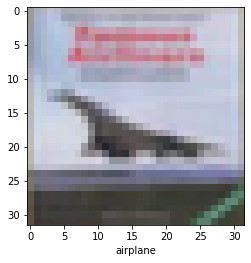

In [36]:
plot_sample(x_test,y_test,3)

In [39]:
classes[y_pred_new[3]]

'airplane'

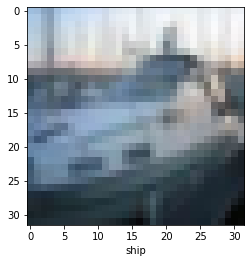

In [40]:
plot_sample(x_test,y_test,2)

In [41]:
classes[y_pred_new[2]]

'truck'

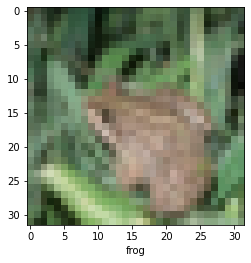

In [42]:
plot_sample(x_test,y_test,4)

In [43]:
classes[y_pred_new[4]]

'frog'

# Excercise

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras

In [2]:
#importing digits dataset
(x_train,y_train),(x_test,y_test)=keras.datasets.mnist.load_data()

In [3]:
x_train.shape

(60000, 28, 28)

In [4]:
y_train.shape

(60000,)

In [5]:
x_test.shape

(10000, 28, 28)

In [6]:
y_test.shape

(10000,)

In [11]:
def plot_sample(x,y,index):
    plt.imshow(x[index])
    plt.title("value : "+str(y[index]))
    plt.show()

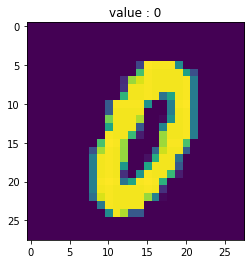

In [12]:
plot_sample(x_train,y_train,34)

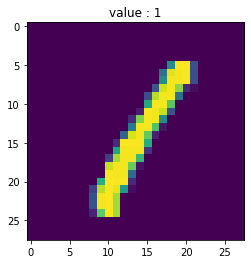

In [13]:
plot_sample(x_train,y_train,3)

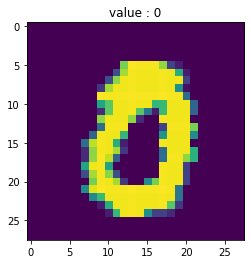

In [14]:
plot_sample(x_train,y_train,69)

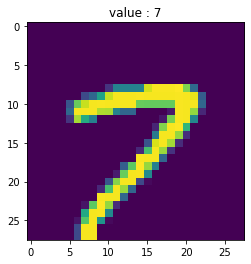

In [15]:
plot_sample(x_train,y_train,123)

In [22]:
model = keras.Sequential([
    
    keras.layers.Conv2D(30, (3,3), activation='relu', input_shape=(28, 28, 1)),
    keras.layers.MaxPooling2D((2,2)),
 
    keras.layers.Flatten(),
    keras.layers.Dense(100, activation='relu'),
    keras.layers.Dense(10, activation='sigmoid')
])

In [23]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(x_train, y_train, epochs=5)

Epoch 1/5
1875/1875 [==============================] - 48s 24ms/step - loss: 0.4984 - accuracy: 0.9301
Epoch 2/5
1875/1875 [==============================] - 45s 24ms/step - loss: 0.0829 - accuracy: 0.9756
Epoch 3/5
1875/1875 [==============================] - 41s 22ms/step - loss: 0.0544 - accuracy: 0.9828
Epoch 4/5
1875/1875 [==============================] - 42s 22ms/step - loss: 0.0411 - accuracy: 0.9869
Epoch 5/5
1875/1875 [==============================] - 49s 26ms/step - loss: 0.0324 - accuracy: 0.9897


In [24]:
model.evaluate(x_test,y_test)

313/313 [==============================] - 4s 8ms/step - loss: 0.1045 - accuracy: 0.9761


[0.10450416058301926, 0.9761000275611877]

In [25]:
predicted_values=model.predict(x_test)

313/313 [==============================] - 2s 7ms/step


In [27]:
predicted_values.shape

(10000, 10)

In [33]:
predicted_values[0]

array([1.6029006e-08, 7.7494152e-04, 1.1622925e-02, 2.7273729e-02,
       5.5248395e-04, 6.7947598e-10, 4.7125617e-08, 9.9999994e-01,
       1.3972331e-03, 9.6395350e-01], dtype=float32)

In [29]:
np.argmax(predicted_values[0])

7

In [30]:
y_pred=[np.argmax(x) for x in predicted_values]
y_pred[:10]

[7, 1, 1, 0, 4, 1, 4, 4, 5, 9]

In [32]:
y_test[:10]

array([7, 2, 1, 0, 4, 1, 4, 9, 5, 9], dtype=uint8)

# Convolution padding and Stride

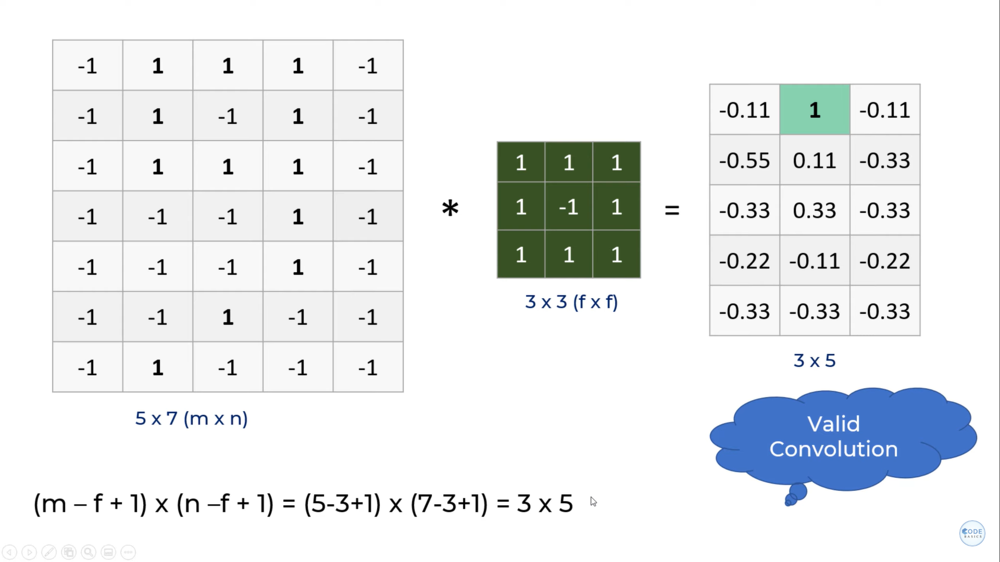

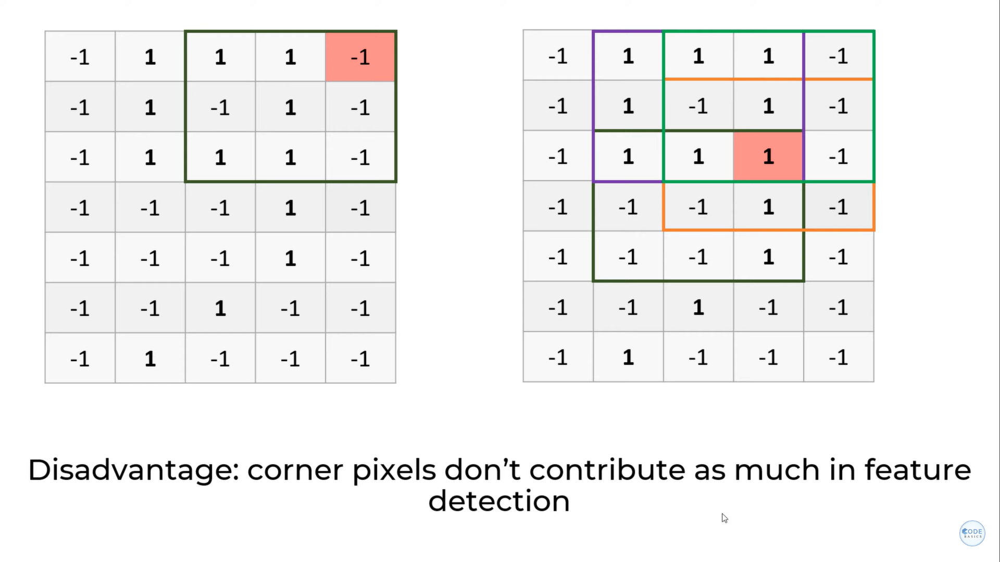
Here, we can observe that corner pixel is visited only once , that means it not contributing properly.    
Hence, this problem can be solved by padding with extra layers.

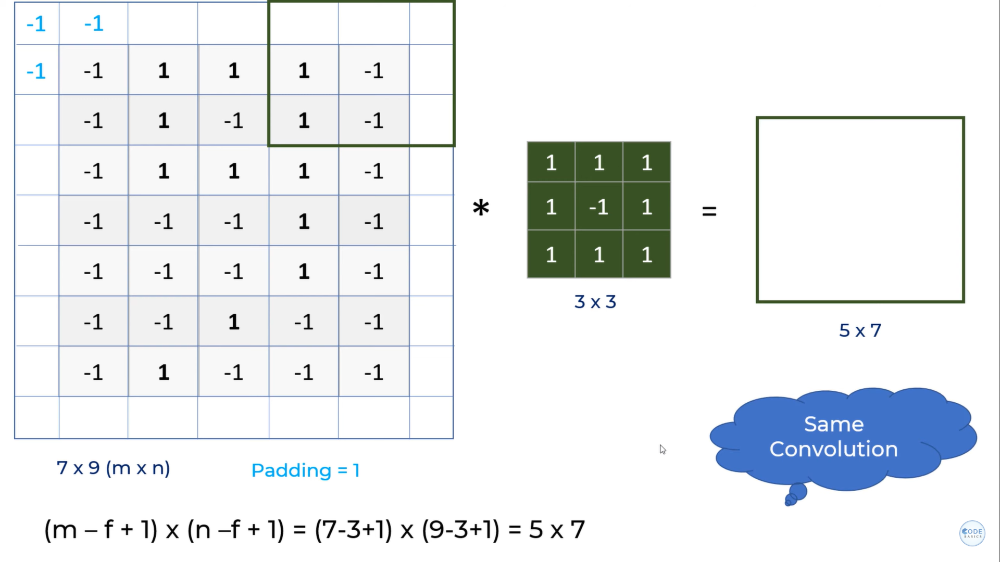

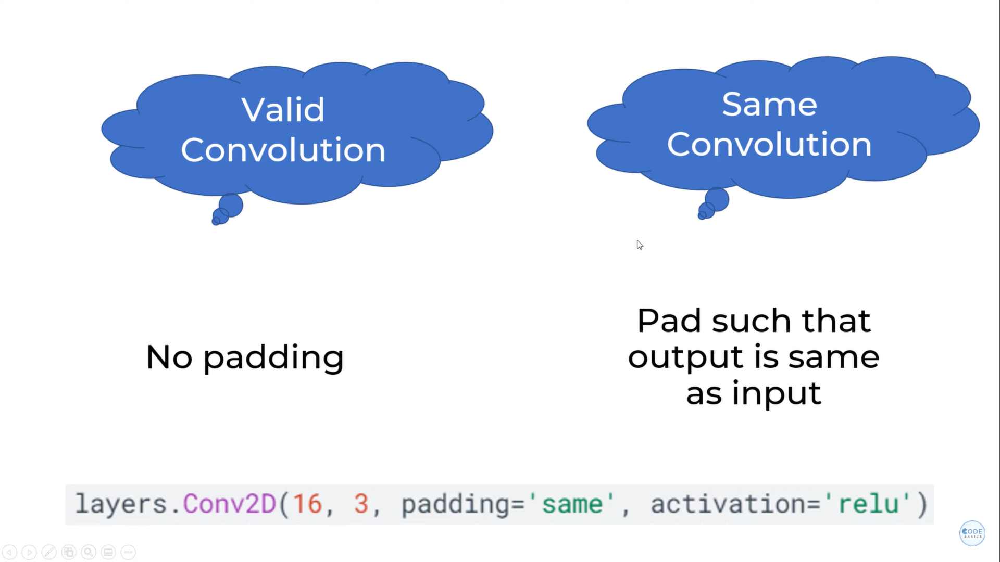

**Strides**

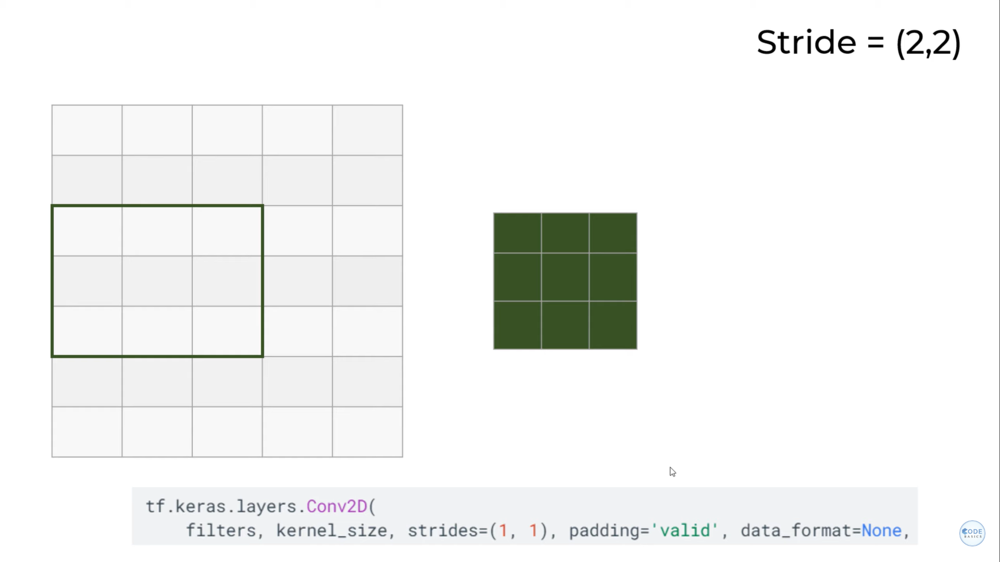